# Computer Vision Project 1 - Cathedral Reconstruction

Authors:
 - Jerzy Łukaszewicz, 145458
 - Konrad Szewczyk, 145466

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import os
from IPython.display import display, HTML

pd.options.display.html.border = 0
pd.options.display.float_format = '{:,.2f}'.format

In [2]:
if 'google.colab' in str(get_ipython()):
  from google.colab.patches import cv2_imshow
  imshow = cv2_imshow
else:
  def imshow(a):
    a = a.clip(0, 255).astype('uint8')
    if a.ndim == 3:
      if a.shape[2] == 4:
        a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
      else:
        a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display(PIL.Image.fromarray(a))

### Downloading of the dataset
The dataset used for this task consists of 5 images of cathedral with several people blocking the view and one result image. The task is to use basic techniques in CV in order to eliminate the people from the foreground and make the entirety of cathedral visible.  

This code can be used to download the necessary data - input images into 'data/input' directory and intended result image into 'data/result'

In [ ]:
!wget -O cathedral.zip https://grail.cs.washington.edu/projects/photomontage/data/cathedral.zip && unzip -o cathedral.zip -d data
!mkdir -p data/result
!mv data/cathedral/result.png data/result/
!mkdir -p data/input 
!mv data/cathedral/* data/input/
!rm -d data/cathedral

In [3]:
datapath = './data/input'
resultpath = './data/result'

## Project objective
The main objective of the code implemented in this project is to find the way of combining five pictures of cathedral with several people in the foreground into one image with no people on it.
### Ideal composition 

In [ ]:
result_img = cv2.imread(resultpath + '/result.png', cv2.IMREAD_COLOR)

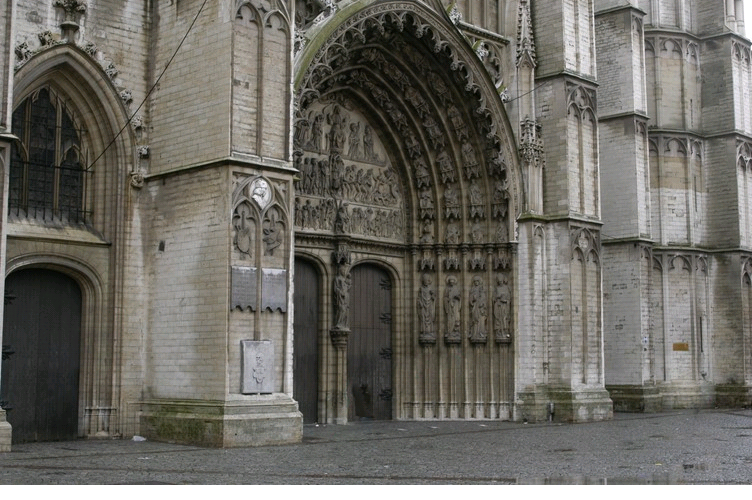

In [5]:
imshow(result_img)

### Available photos

In [6]:
images = [datapath + item for item in os.listdir(datapath)]

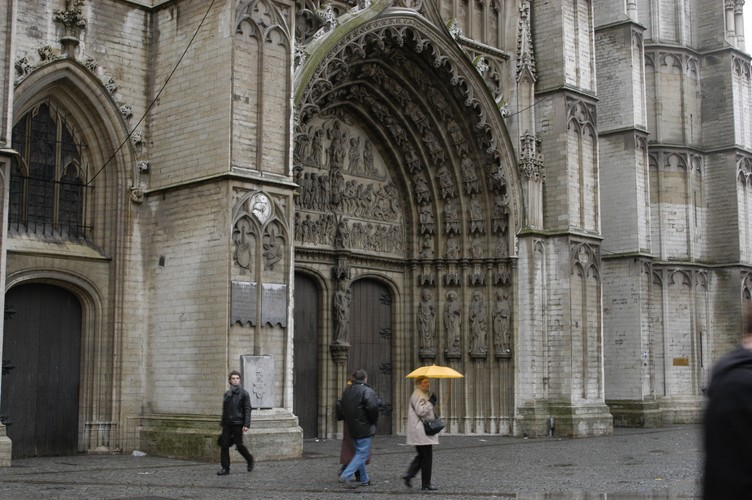

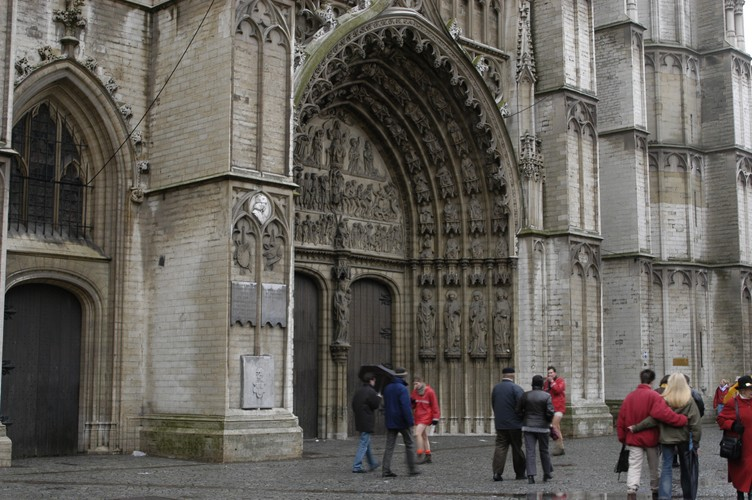

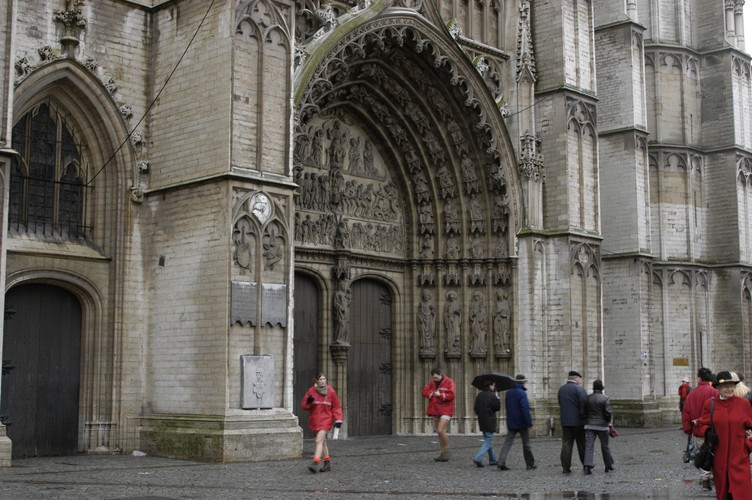

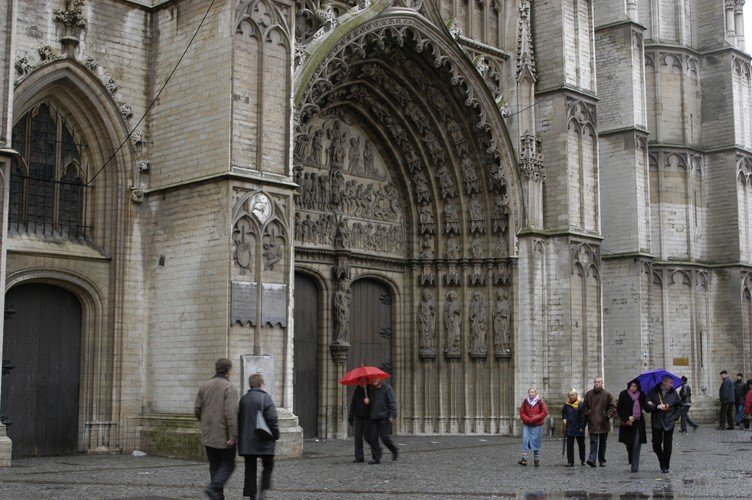

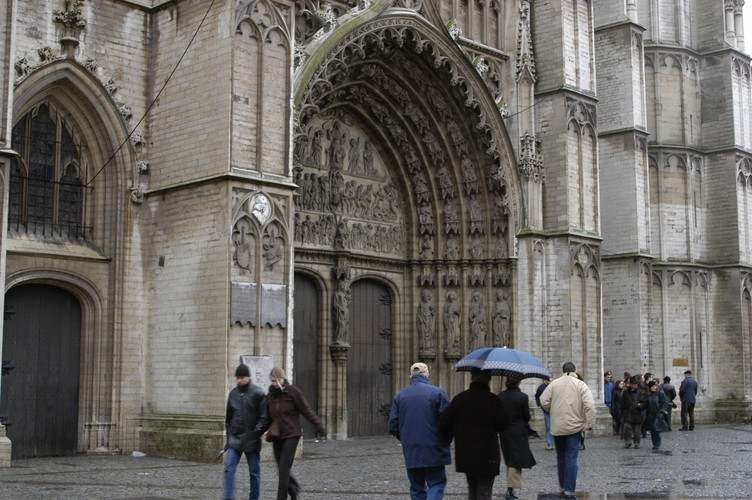

In [7]:
img_color = []
for img in images:
    img_n = cv2.imread(img, cv2.IMREAD_COLOR)
    img_color.append(img_n)
    imshow(img_n)

In [8]:
from itertools import combinations

## Approach #1 - simple merging methods
We are aware that neither of these methods will probably provide a satisfactory image, but we believe it may be good to visualise their results.

### Taking mean values of pixels

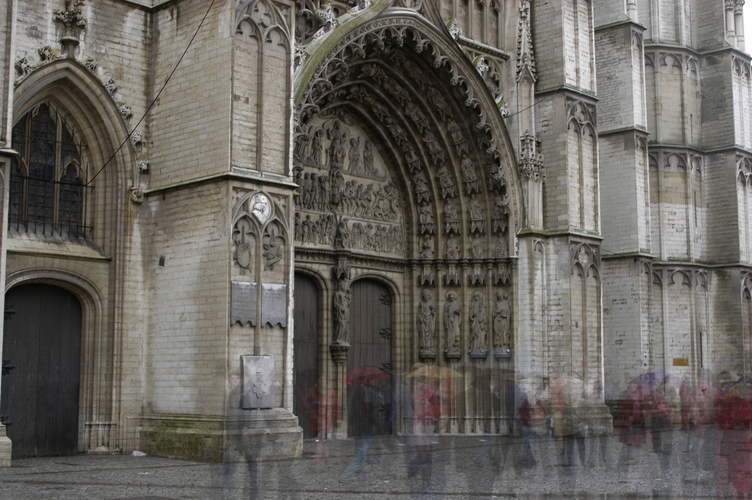

In [9]:
result_mean = np.mean(img_color, axis=0)
imshow(result_mean)

As suspected, taking a simple average of input images results in severe ghosting issues.

### Taking median values of pixel
In some cases, taking median of the pixels' values may be enought to satisfactorily combine pictures assuming that there are not much overlapping obstuctions.

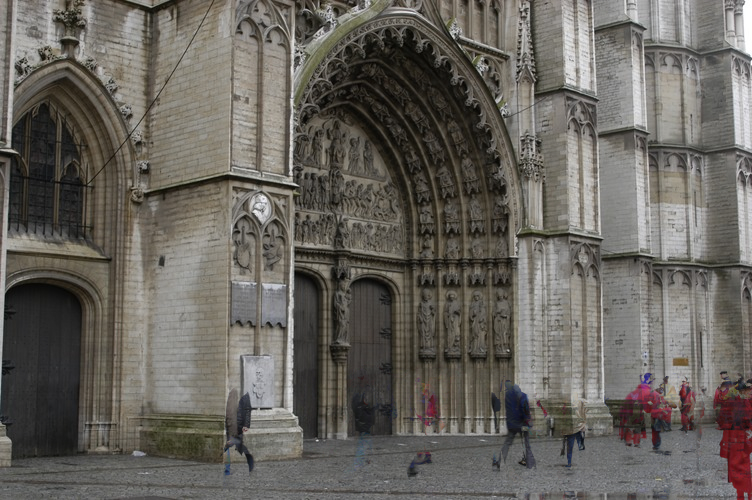

In [10]:
result_median = np.median(img_color, axis=0)
imshow(result_median)

Unfortunatelly, while we are able to easily fill some of the areas, in some places several people occur on a lot of photos. Thus, taking a median results in severe artifacts and floating fragments of people and clothing.

### Selecting the color most similar to a given pixel's mean

In [11]:
def most_similar_to_mean(imgs, shape):
    new_result = np.zeros(shape)
    for i in range(shape[0]):
        for j in range(shape[1]):
            pix = []
            
            for img_c in imgs:
                pix.append(img_c[i][j].astype(np.float32) / 255)
         
            mean_pix = np.mean(pix, axis=-2)
            cos = []
            for k in pix:
                sim = np.linalg.norm(k-mean_pix, 4)
                cos.append(1-sim)
            best = cos.index(max(cos))
            avg = pix[best]
            avg = np.floor(avg * 255)
            new_result[i][j]=avg.astype("uint8")
            
    return new_result

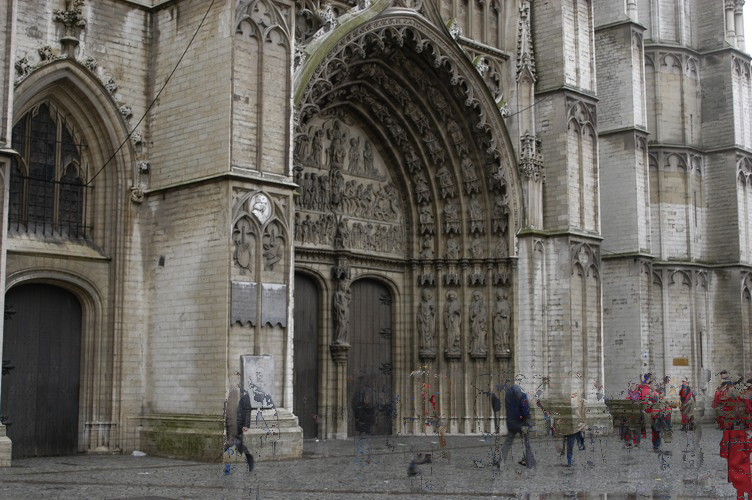

In [12]:
good_res = most_similar_to_mean(img_color, result_img.shape).astype(np.uint8)
imshow(good_res)

Unfortunately, in the regions with a lot of overlapping people, this method encounters the same problems as the previous methods (median).

## Approach #2 - colour-based weighted selection of pixels

It can be observed that most of the overlapping unwanted elements between pictures consist of mostly black/dark or vibrantly red pixels.  

Therefore, it might make sense to penalize the chances of the pixel being selected for being too dark (black coats, jackets) or too vibrant (red coats, colourful umbrellas).

In [13]:
def normalise_img(img):
    img = img.astype(np.float32)
    img_min = np.min(img, axis=(-3, -2))
    img_max = np.max(img, axis=(-3, -2))
    return ((img - img_min) / (img_min + img_max)).astype(np.float32)

In [14]:
def colored_weights(imgs):
    weights = []
    for img in imgs:
        img = np.array(img)
        img_color_means = np.mean(img / 255, axis=-1, keepdims=True)
        test = 0.75 - np.max((np.absolute(img / 255 - img_color_means)), axis=-1) + np.min(img / 255, axis=-1) * 0.25
        weights.append(test**5 * 255)
    return weights

weights = colored_weights(img_color + [good_res,])

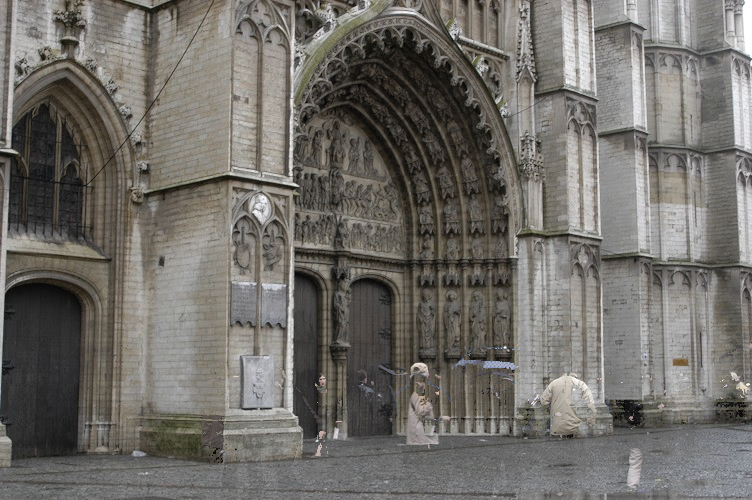

In [15]:
def weighted_image(imgs, weights, shape):
    result = np.zeros(shape)
    for i in range(shape[0]):
        for j in range(shape[1]):
            best_weight = 0
            best = None
            for idx, img_c in enumerate(imgs):
                if best_weight < weights[idx][i][j]:
                    best_weight = weights[idx][i][j]
                    best = img_c[i][j]
            result[i][j]=best
    return result

color_weighted_result = weighted_image(img_color + [good_res, ], weights, result_img.shape)
imshow(color_weighted_result)

Unfortunately, while this method succesfully eliminated most or all of previously problematic area, algorithm prefers parts of clothing that are similar in colour the "walls" of the cathedral - such as light-brown jacket on the may in fifth photo.

### Alternative: combinations of images based on weights
This method works by merging the input images by taking the average of pictures that for a given pixel have their weight (introduced in the previous approach) exceed a threshold value = 70.  

Based on the masks obtained using mentioned thresholding, we generate two images:  

* temp_1: weighted average of input images, where the weight depends on the mask created by the aforementioned thresholding (morphological OPEN is applied to the mask beforehand) 

* temp_2: pixels from additional "filler" image (in our case, image obtained by the previous method) that occur in places where none of the previous masks was positive  

These two images are then averaged and multiplied my two, since averaging alone would result in an image with half of original brightness and, due to usage of masks, the generated pixels should not overlap.

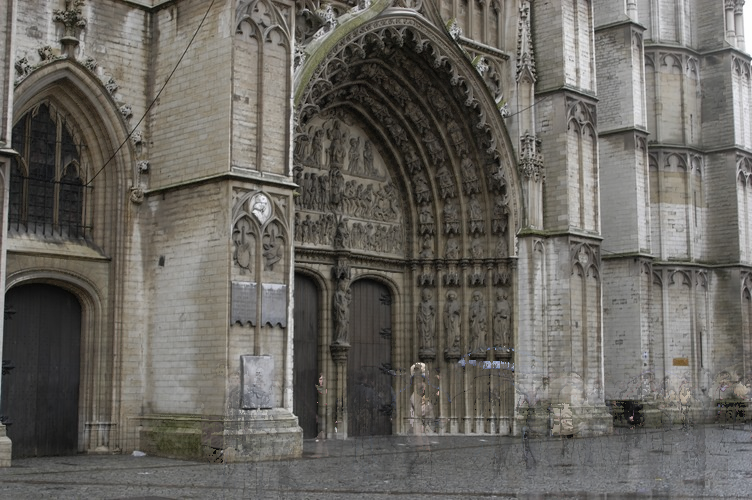

In [16]:
def combine_by_weights(imgs, img_2, weights):
    temps = []
    temp_imgs = []
    for idx, weight in enumerate(weights):
        w = (weight > 70) * 255
        temp = cv2.morphologyEx(w.astype(np.uint8), cv2.MORPH_OPEN, (11, 11))
        temps.append(temp)
        temp_img = np.stack([temp, temp, temp], axis=-1) / 255 * imgs[idx]
        temp_imgs.append(temp_img)

    temp_1 = np.average(temp_imgs, weights=np.stack([temps] * 3, axis=-1) + 0.0001, axis=0)
    fill_mask = (1 - np.max(temps, axis=0) / 255)
    temp_2 = img_2 * np.stack([fill_mask] * 3, axis=-1)
    return np.mean((temp_1, temp_2), axis=(0)) * 2

filled_result = combine_by_weights(img_color, color_weighted_result, weights[:-1])
imshow(filled_result)

Surprisingly, this method does provide results that are much better than anticipated; although, there are still frequent and rather "sharply-looking" artifacts scattered across the image, they are not as visible as in the case of previous results.

### Potential further improvement

Having obtained a relatively satisfying result, we can search for a way to improve on it slightly. The first thought that came into our minds when thinking about it was whether we really need to apply our techniques to all pixels in the picture.

#### Observation - areas in which all images agree

We can easily notice that there exist areas in which all of the images agree - furthermore, there areas comprise most of the picture's area. While this does not help us in the most crowded area, it means that there exists some areas for which it doesn't matter which picture is taken, since all of them provide similar results.  

When computing "agreeing" pixels, we accept some degree of difference due to slight variance in exposure and lighting conditions in the pictures.

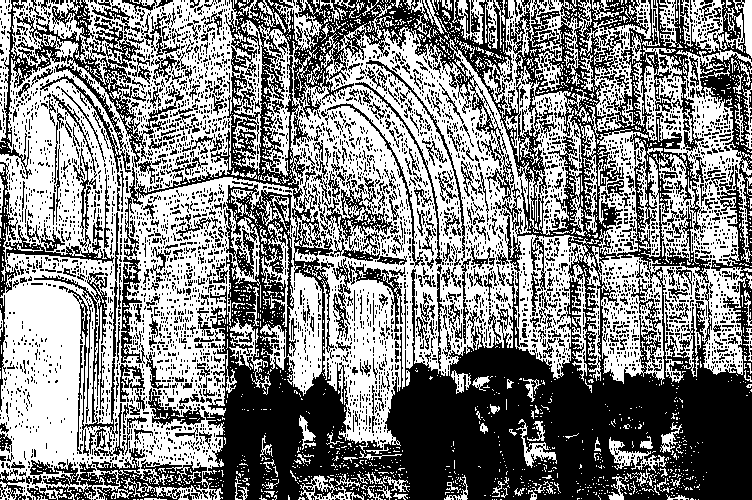

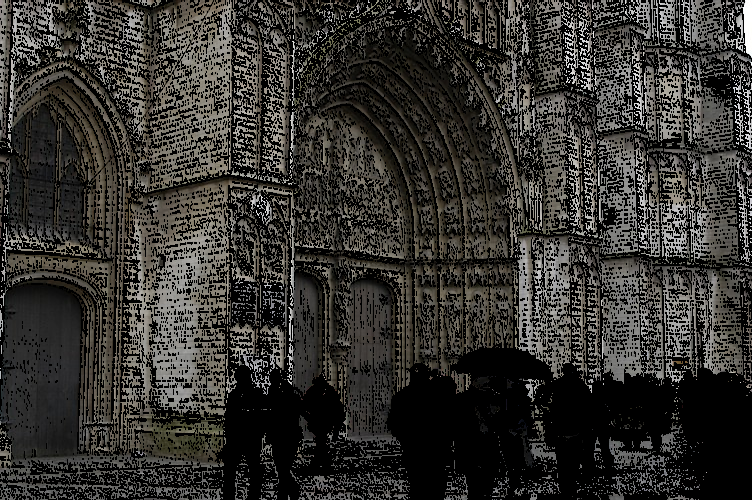

In [17]:
pic = img_color[2]
for img in img_color[4:]:
    mask = np.stack([np.all(np.absolute(pic.astype(np.float32) - img) < 10, axis=-1)] * 3, axis=-1)
    mask = cv2.morphologyEx(mask.astype(np.float32), cv2.MORPH_CLOSE, (11, 11))
    pic = np.where(mask, pic, np.zeros(mask.shape))
imshow(mask * 255)
imshow(pic)

#### Extension - combination of areas where at least 4 images agree
Perhaps we do not need to for all of the images to agree on a particular pixel - if at least 4 images agree, even within a slightly higher range of acceptance, we may assume that they value for this pixel represents the actual background. 

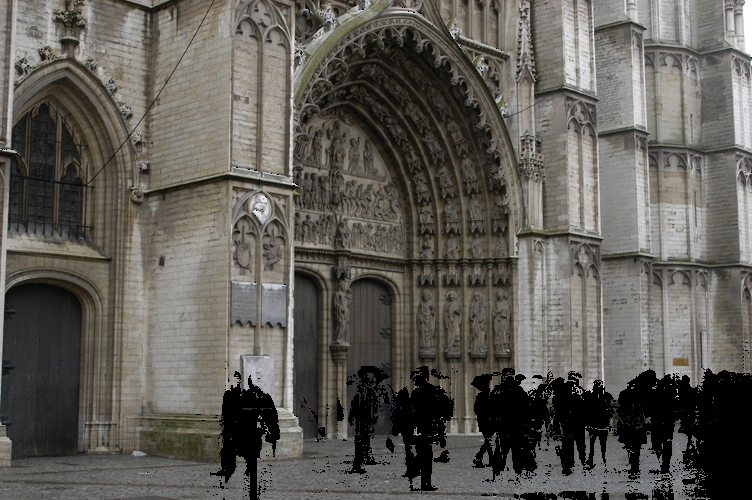

In [18]:
def similar_in_quads(imgs):
    masks = []
    images_test = []
    for quads_img in combinations(imgs, 4):
        temp_masks = []
        for duo in combinations(quads_img, 2):
            img_1, img_2 = duo 
            img_1, img_2 = img_1.astype(np.float32) / 255, img_2.astype(np.float32) / 255
            temp_mask = np.all(np.absolute(img_1 - img_2) < 30/255, axis=-1)
            temp_masks.append(temp_mask)
        final_mask = np.stack([np.min(temp_masks, axis=0)] * 3, axis=-1)
        image_test = final_mask * np.mean(quads_img, axis=0)

        masks.append(final_mask)
        images_test.append(image_test)

    safe_masks = np.array(masks) + 0.0001
    masks_union = np.max(np.array(masks), axis=0)
    final = np.where(np.any(safe_masks, axis=0), np.average(images_test, axis=0, weights=safe_masks), np.zeros(result_img.shape))
    return final, masks_union
    
quad_res, quad_mask = similar_in_quads(img_color)
imshow(quad_res)

As it can be seen above, there are not artifacts on such combined picture; hence, we may check the impact of combining this picture with the one obtained previously - we will do it by filling the black pixels with the values from 'filled_result' (combinations of images based on weights).

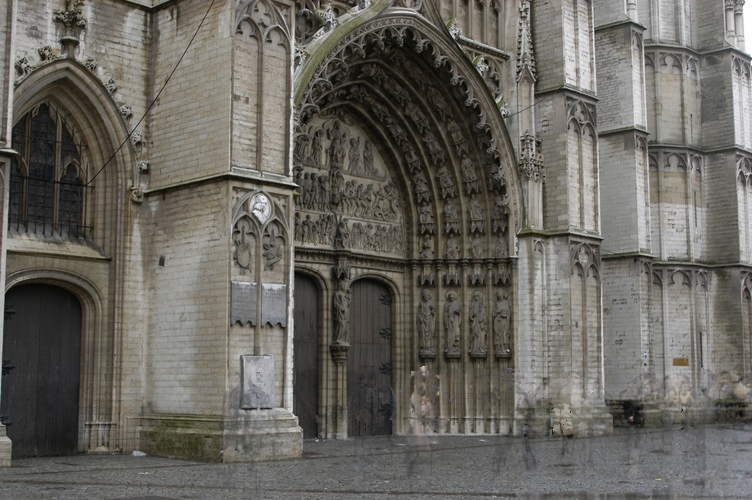

In [19]:
optimal_result = np.where(np.stack([np.all(quad_mask, axis=(-1))] * 3, axis=-1), quad_res, cv2.GaussianBlur(filled_result, (5, 5), 0.6))
imshow(optimal_result)

Certainly, this is the best picture we have obtained thus far. For some time now, we will depart from this approach in order to check the performance of an alternative technique.

## Approach #3: kMeans-based selection of segments matching the ground-truth

This method consists of training a k-Means model to assign individual segments of an image to one of the classes.   

First, we train it on the set of segments from a ground truth (obtained previously image consisting of pixels there exists a set of 4 images that agree). The description of functions used in this stage has been provided within docstrings withing functions.  

Then, the number of elements assigned to every cluster is calculated, which is used later during scoring of pixel during their selection for being put into the output picture.  

Finally, the descriptors are calculated for the list of input images and for every pixel not in the ground truth a score is calculated - rather simple, being a multiplication of frequency of the given class/cluster occuring and the Frobenius norm of the difference between pixel value and the centroid of a given cluster. The pixel from the image with the best score is the assigned to the given position.

#### Ground truth

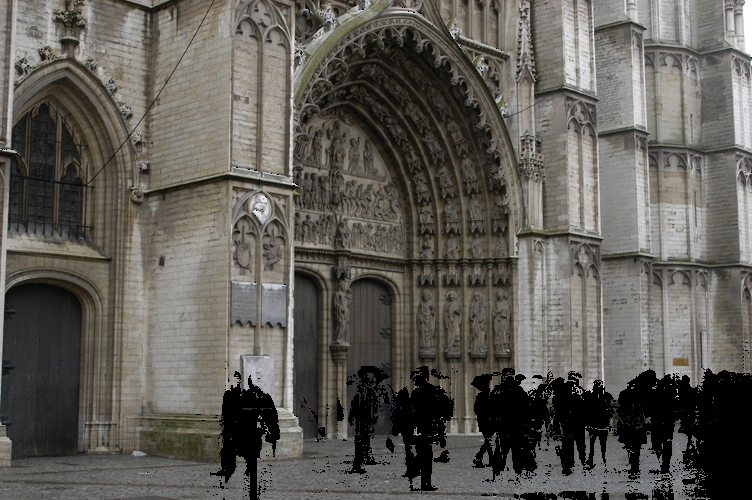

In [20]:
imshow(quad_res)

#### Calculation of pixel descriptors

In [21]:
import math
from numpy.lib.stride_tricks import as_strided

def pixel_descriptor(img):
    """
    Returns a simple descriptor for every pixel in the image.
    The returned descriptor is simply binning of color values into 16*3 bin of "range" 16.
    """
    temps = []
    for i in range(16):
        temps.append(np.all([img > 16 * i, img <= 16 * (i + 1)], axis=0))
    desc = np.concatenate(temps, axis=-1)
    return desc

def add_padding(img, area_shape):
    """
    Returns a padded version of input image
    """
    pad_v = (area_shape[0] - 1) / 2
    pad_h = (area_shape[1] - 1) / 2
    fb = cv2.copyMakeBorder(img, math.floor(pad_v), math.ceil(pad_v), math.floor(pad_h), math.ceil(pad_h), cv2.BORDER_REFLECT)
    return fb

def color_distribution(area):
    """
    Returns a pixel descriptors calculated over the neighbourhood of the pixel.
    The returned vector is a vector of probability of a value belonging to a given bin.
    However, if too many values were equal to zero, then the entire result is zeroed.
    """
    area_sum = np.sum(area, axis=(0, 1))
    if np.sum(area_sum) < 0.7 * np.prod(area.shape[:-1]):
        return np.zeros(area_sum.shape)
    return area_sum / np.sum(area_sum)

def area_descriptor(img, size, pixel_desc = pixel_descriptor, area_desc = color_distribution, area_attr = 48):
    """
    Returns for every pixel a given area descriptor calculated over its neighbourhood.
    """
    img_padded = add_padding(img, size)
    desc_img = pixel_desc(img_padded)

    matching_shape = (desc_img.shape[0] - size[0] + 2 - size[0] % 2, desc_img.shape[1] - size[1] + 2 - size[1] % 2)
    neighbours = as_strided(desc_img.astype(np.uint8), shape=matching_shape + size + (desc_img.shape[-1],), strides=desc_img.strides[:2] + desc_img.strides)
    output = np.zeros(matching_shape + (area_attr, ), dtype=np.float32)
    
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            output[x, y] = area_desc(neighbours[x, y])
    
    return output

In [22]:
res = area_descriptor(quad_res, (15, 15))

#### Training of kMeans

In [23]:
import sklearn
from sklearn import cluster

In [24]:
CLUSTER_NO = 8

X = res.reshape((np.product(res.shape[:-1]), res.shape[-1]))

X = np.delete(X, np.where(np.sum(X, axis=-1) < 0.1, True, False), axis=0)

kMeans = cluster.KMeans(n_clusters = CLUSTER_NO)
kMeans.fit(X)


KMeans()

In [25]:
cluster_freq = np.zeros(CLUSTER_NO, dtype=np.uint32)
for desc in X:
    cls = kMeans.predict(desc.reshape(1, desc.shape[0]))
    cluster_freq[cls] += 1


#### Filling the ground-truth with the scores pixels from input images

In [26]:
def input_area_descriptor(img, ground, mask, size, pixel_desc, area_desc, area_attr):
    """
    Similar to the function area_descriptor; however, this time a mask is used. 
    For pixel existing withing ground-truth image, that value is used when calculating descriptors.
    Otherwise, we use the values from the input image.
    """
    img_filled = np.where(mask, ground, img)
    img_padded = add_padding(img_filled, size)
    desc_img = pixel_desc(img_padded)
    

    matching_shape = (desc_img.shape[0] - size[0] + 2 - size[0] % 2, desc_img.shape[1] - size[1] + 2 - size[1] % 2)
    neighbours = as_strided(desc_img.astype(np.uint8), shape=matching_shape + size + (desc_img.shape[-1],), strides=desc_img.strides[:2] + desc_img.strides)
    output = np.zeros(matching_shape + (area_attr,), dtype=np.float32)
    
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            if not np.any(mask[x][y]):
                output[x, y] = area_desc(neighbours[x, y])

    return output

In [27]:
def fill_kNN(ground, imgs, mask, size, kMeans, cluster_freqs, pixel_desc = pixel_descriptor, area_desc = color_distribution, area_attr = 48):
    """
    Return an output image will values filled using scoring based on previously calculated kMeans.
    """
    img_descs = []
    for img in imgs:
        img_descs.append(input_area_descriptor(img, ground, mask, size, pixel_desc = pixel_desc, area_desc = area_desc, area_attr = area_attr))
    
    output = np.copy(ground)
    for x in range(output.shape[0]):
        for y in range(output.shape[1]):
            if np.all(mask[x, y]):
                continue
            chosen_pix = imgs[0][x, y]
            chosen_cluster = kMeans.predict(img_descs[0][x,y].reshape(1, img_descs[0][x,y].shape[0]))
            chosen_score = cluster_freqs[chosen_cluster] * 1 / np.linalg.norm(img_descs[0][x,y] - kMeans.cluster_centers_[chosen_cluster], 2)
            for (pix, desc) in zip(imgs[1:], img_descs[1:]):
                cluster = kMeans.predict(desc[x,y].reshape(1, desc[x, y].shape[0]))
                score = cluster_freqs[cluster] * 1 / np.linalg.norm(desc[x,y] - kMeans.cluster_centers_[cluster], 2)
                if score > chosen_score:
                    chosen_pix = pix[x,y]
                    chosen_cluster = cluster
                    chosen_score = score
            output[x, y] = chosen_pix
    return output

#### Output

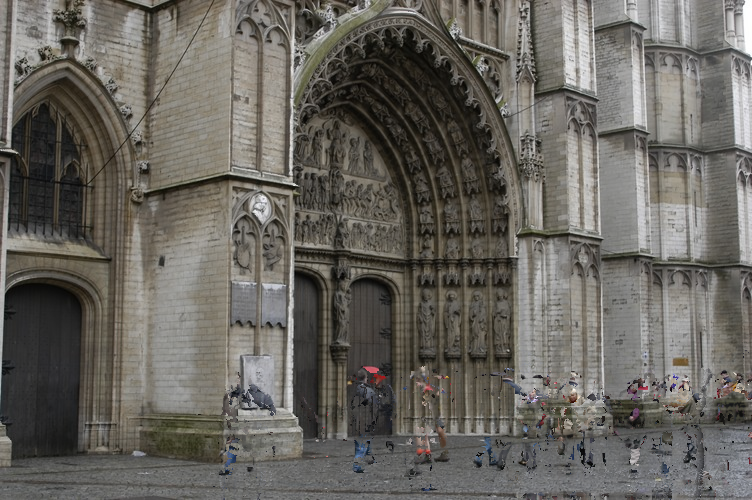

In [28]:
testing_out = fill_kNN(quad_res, img_color + [optimal_result], quad_mask, (11, 11), kMeans, cluster_freq)
imshow(testing_out)

In [29]:
del res
del X 
del cluster_freq

### Different descriptors: identity ('pixel' descriptor) and calculation of statistics over the area ('segment' descriptor)

There is no need to limit ourselves to one set of descriptors - in the following two sections, we test the performance of different descriptors:  

* pixel descriptor - identity; simple copying of input image  

* segment descriptor - statistics over the area; returns a set of statistics [mean, min, max] calculated over the given set of pixels


In [30]:
def identity(img):
    """
    Returns a copy of the input image
    """
    return img.astype(np.uint8) 

def stats_area_descriptor(img):
    """
    Returns calculated statistics for a set of pixels
    """
    if np.sum(np.where(img == 0, True, False) > 0.3 * np.product(img.shape)):
        return np.zeros(9).astype(np.float32)
    mean = np.mean(img, axis=(0, 1))
    min = np.min(img, axis=(0, 1))
    max = np.max(img, axis=(0, 1))
    return np.concatenate([mean, min, max]).astype(np.float32)

In [31]:
stats_res = area_descriptor(quad_res, (25, 25), pixel_desc = identity, area_desc = stats_area_descriptor, area_attr=9)

In [32]:
CLUSTER_NO = 10

stats_X = stats_res.reshape((np.product(stats_res.shape[:-1]), stats_res.shape[-1]))

stats_condition = np.where(np.sum(stats_X[..., 3:6], axis=-1) < 15, True, False)
stats_X = np.delete(stats_X, stats_condition, axis=0)

stats_kMeans = cluster.KMeans(n_clusters = CLUSTER_NO)
stats_kMeans.fit(stats_X)


KMeans(n_clusters=10)

In [33]:
stats_cluster_freq = np.zeros(CLUSTER_NO, dtype=np.uint32)
for desc in stats_X:
    cls = stats_kMeans.predict(desc.reshape(1, desc.shape[0]))
    stats_cluster_freq[cls] += 1

#### Output

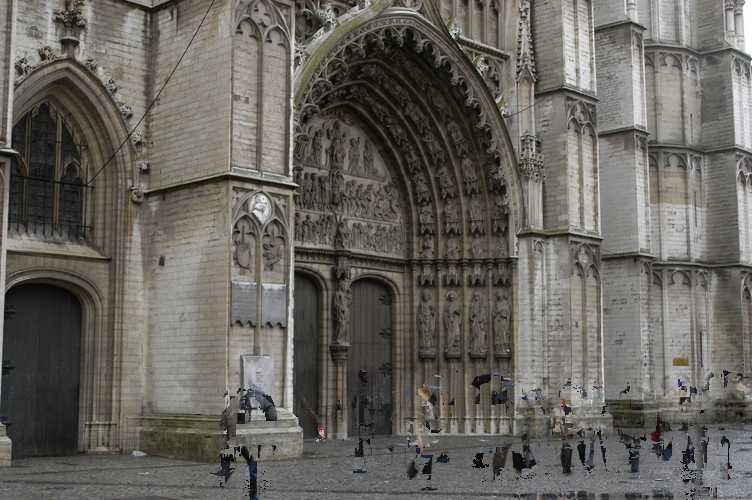

In [34]:
testing_stats = fill_kNN(quad_res, img_color + [optimal_result], quad_mask, (25, 25), stats_kMeans, stats_cluster_freq, pixel_desc=identity, area_desc=stats_area_descriptor, area_attr=9)
imshow(testing_stats)

In [35]:
del stats_res
del stats_X 
del stats_cluster_freq

### Different segment descriptor: calculation of statistics over the area with gaussian correction of the mean

This time we apply a small correction to the calculated mean within our statistics. We create a Gaussian kernel that represents a matrix of weights used during the calculation of the average.

In [36]:
def gaussian_stats_area_descriptor(img):
    if np.sum(np.where(img == 0, True, False) > 0.3 * np.product(img.shape)):
        return np.zeros(9).astype(np.float32)
    kernel = cv2.getGaussianKernel(img.shape[0], 1)
    kernel = np.stack([kernel * np.transpose(kernel)] * 3, axis=-1)
    mean = np.average(img, axis=(0, 1), weights=kernel)
    min = np.min(img, axis=(0, 1))
    max = np.max(img, axis=(0, 1))
    return np.concatenate([mean, min, max]).astype(np.float32)

In [37]:
gauss_res = area_descriptor(quad_res, (25, 25), pixel_desc = identity, area_desc = gaussian_stats_area_descriptor, area_attr=9)

In [39]:
CLUSTER_NO = 10

gauss_X = gauss_res.reshape((np.product(gauss_res.shape[:-1]), gauss_res.shape[-1]))

gauss_condition = np.where(np.sum(gauss_X[..., 3:6], axis=-1) < 15, True, False)
gauss_X = np.delete(gauss_X, gauss_condition, axis=0)

gauss_kMeans = cluster.KMeans(n_clusters = CLUSTER_NO)
gauss_kMeans.fit(gauss_X)

KMeans(n_clusters=10)

In [40]:
gauss_cluster_freq = np.zeros(CLUSTER_NO, dtype=np.uint32)
for desc in gauss_X:
    cls = gauss_kMeans.predict(desc.reshape(1, desc.shape[0]))
    gauss_cluster_freq[cls] += 1

#### Output

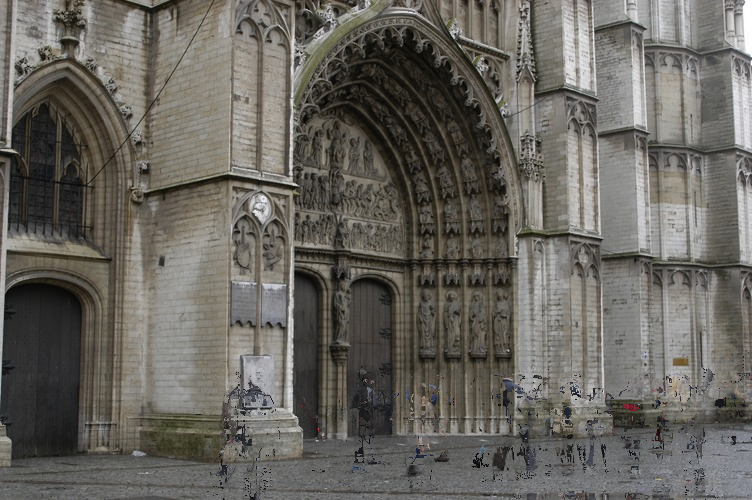

In [41]:
testing_gauss = fill_kNN(quad_res, img_color + [optimal_result], quad_mask, (25, 25), gauss_kMeans, gauss_cluster_freq, pixel_desc=identity, area_desc=gaussian_stats_area_descriptor, area_attr=9)
imshow(testing_gauss)

In [42]:
del gauss_res
del gauss_X 
del gauss_cluster_freq

### Summary
None of the descriptors used in this approach lead to satisfying results - although the last one, produced relatively small amount of artifacts, it was still way too visible.  

Of course, there is a lot of place for improvement in our implementation of kMeans (e.g. standardisation of data); however, since this project is focused mostly on the Computer Vision aspect of it all, we have decided not to dwell on it, since it would shift the focus of this notebook more towards Machine Learning/Data Mining domain.

## Approach #4: median of previously generate images

Despite the fact that no individual image provided us with a fully satisfying results, we suspect that taking a median over some of the generated results may lead to a combination of the most beneficial features of its components. For a little bit of additional smoothing, we apply GaussianBlur with a very low value of sigma.

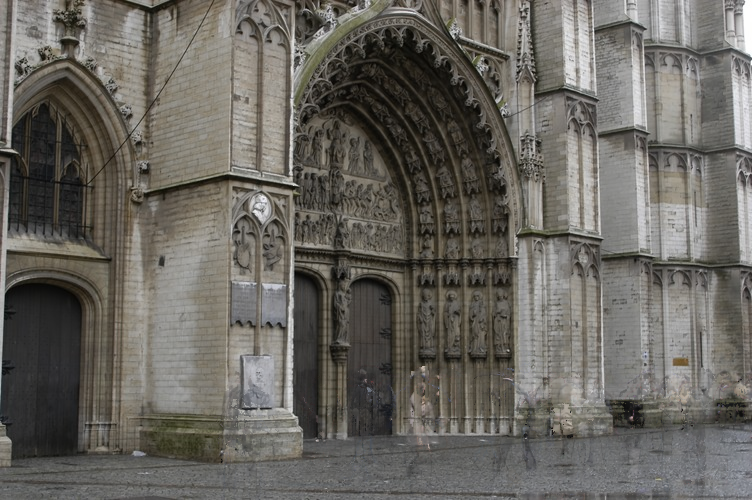

In [43]:
combined_result = cv2.GaussianBlur(np.median([testing_gauss, optimal_result, filled_result, color_weighted_result, testing_out], axis=0), (7, 7), 0.3)
imshow(combined_result)

Although the resulting image is not perfect, subjectively it slighly improves on all of its comprising images. Of course, it is still filled with some minor artifacts; however, for a technique utilising no complex approaches such as feature detection or neural networks, we believe that the resulting image is at least acceptable.

#### Intended output:

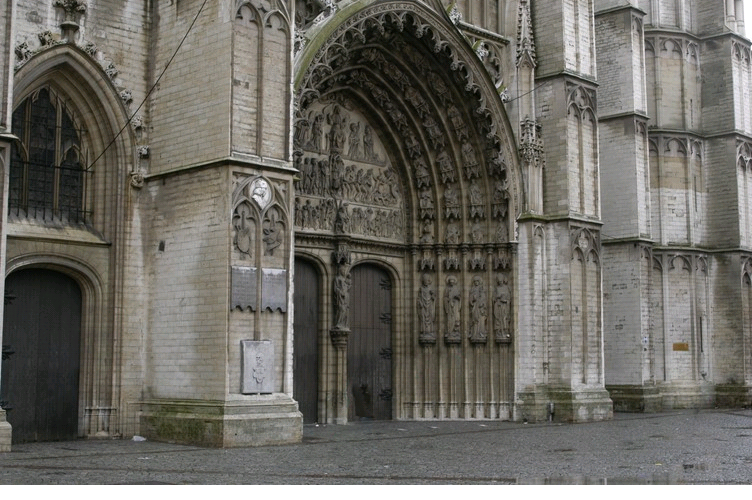

In [44]:
imshow(result_img)

## Curiosity - manual selection of areas
Although not presented as a viable solution to the given problem, we have decided to manually check how fine would we be able to combine the images into the clear output - for that, we have used a combination of original images and results obtained by us. As it can be seen, no more that 7 cuts were needed when doing so over some of the generated outputs.

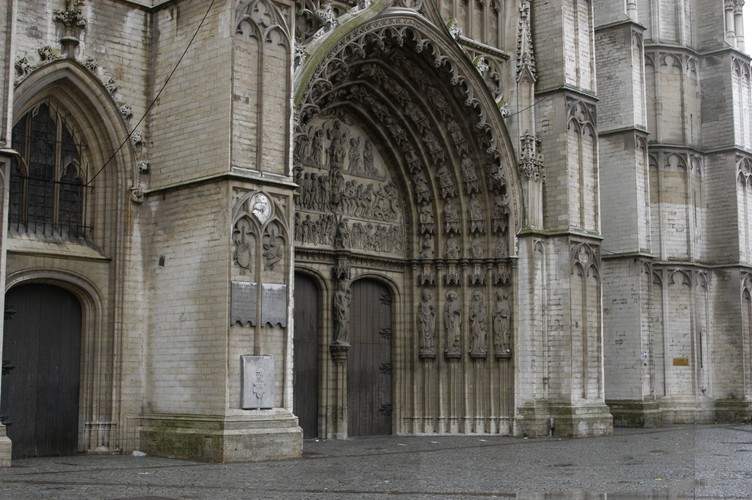

In [45]:
manual_result = color_weighted_result

manual_result[420:,640:,]=color_weighted_result[420:,640:]
manual_result[450:,:628]= color_weighted_result[450:,:628]
manual_result[:,:353] = img_color[1][:,:353]
manual_result[:,700:] = img_color[4][:,700:]
manual_result[:,398:518] = img_color[3][:,398:518]
manual_result[:,480:695] = img_color[0][:,480:695]
manual_result[:,345:420] = img_color[2][:,345:420]

imshow(manual_result)